<a href="https://colab.research.google.com/github/kroezem/DinoPatch/blob/main/DinoPatch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# DinoPatch Anomaly Detector
* Mattias Kroeze and Jairus Abad

# Install and Import Dependancies

In [ ]:
%%capture
!pip install gdown opencv-python matplotlib tqdm sklearn
!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu124

import os
import math
import random
import gdown
import numpy as np
import cv2
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms
from sklearn.decomposition import PCA

# Set torch Device
* Change runtime to T4 to run using CUDA. Will use CPU otherwise.
* If this output says "Running on: cpu" please change runtime to T4.
  * Runtime on toolbar
  * Change runtime type
  * T4 GPU

⚠ WARNING: This notebook will take ~1 hr to run on CPU vs ~5 min using CUDA

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Running on:", device)

Running on: cuda


# Initialize Datasets
*   Dataset path dictionary definition
*   Download and extract datasets
*   Horizontal flip dataset expansion



In [ ]:
train_datasets = {
    "screws": "./dataset/screws/train/expanded",
    "pasta": "./dataset/pasta/train/expanded",
}

test_datasets = {
    "screws": {
        "good": "./dataset/screws/test/good",
        "bad": "./dataset/screws/test/bad"
    },
    "pasta": {
        "good": "./dataset/pasta/test/good",
        "bad": "./dataset/pasta/test/bad"
    }
}



file_id = "1_pRKXtYRjWjY0seYqyx25nOxjtr-mHYg"
output_file = "dataset.zip"
if not os.path.exists(output_file):
    gdown.download(id=file_id, output=output_file, quiet=False)
    gdown.extractall(output_file)
print()


for key in ["pasta", "screws"]:
    os.makedirs(train_datasets[key], exist_ok=True)

    image_count = 0
    train_files = np.sort(os.listdir(f"./dataset/{key}/train/good"))

    for file in train_files:
        image_path = os.path.join(f"./dataset/{key}/train/good", file)
        image = cv2.imread(image_path)

        if image is not None:
            # SAVE ORIGINAL AND MIRRORED
            transformed_images = [image, cv2.flip(image, 1)]
            for i, transformed_img in enumerate(transformed_images):
                output_path = os.path.join(train_datasets[key], f"{image_count + i}.jpg")
                cv2.imwrite(output_path, transformed_img)

            image_count += len(transformed_images)

    print(f"Expanded {key} from {len(train_files)} to {image_count} images.")

Downloading...
From: https://drive.google.com/uc?id=1_pRKXtYRjWjY0seYqyx25nOxjtr-mHYg
To: /content/dataset.zip
100%|██████████| 2.11M/2.11M [00:00<00:00, 20.1MB/s]



Expanded pasta from 17 to 34 images.
Expanded screws from 18 to 36 images.


# Extract Information Using Canny Edges and PCA

* Mean of Canny edges gives an approximate centerpoint of the object(s) within the image

* Angle of primary PCA axis gives us the orientation of the object(s)
  * polarity of this axis is corrected during feature extraction

* PCA primary axis explained variance gives us an approximate scale factor of the object(s), <br>allowing us to effectively zoom without cutting off relevant features

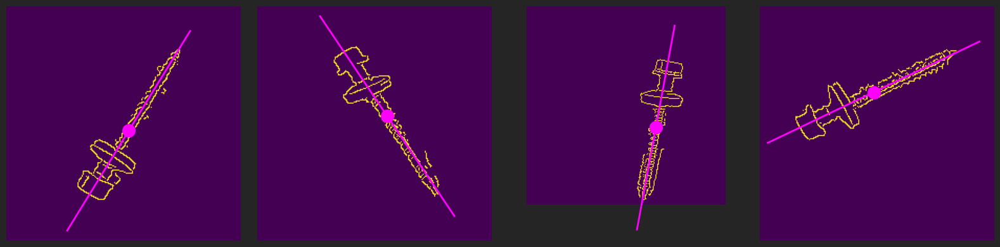

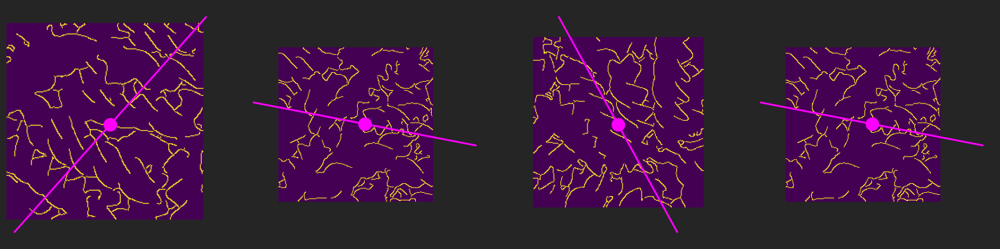

In [ ]:
def pca_info(img):
    grey = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    blurred = cv2.GaussianBlur(grey, (5, 5), 0)
    edges = cv2.Canny(blurred, 100, 200)

    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    points = np.vstack(contours).squeeze()

    pca = PCA(n_components=2)
    pca.fit(points)

    mean = pca.mean_[::-1]
    angle = np.degrees(np.arctan2(pca.components_[0, 1], pca.components_[0, 0]))
    scale = int(2.5 * np.sqrt(pca.explained_variance_[0]))

    return mean, angle, scale, edges

# PLOTTING
for key in train_datasets.keys():
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    fig.patch.set_facecolor("#252525")
    for i in range(4):
        image_path = random.choice(os.listdir(train_datasets[key]))
        image_path = os.path.join(train_datasets[key], image_path)

        img = cv2.imread(image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        mean, angle, scale, img = pca_info(img)

        axes[i].imshow(img)
        axes[i].axis("off")

        mean_y, mean_x = mean
        angle = np.deg2rad(angle)
        dx = np.cos(angle) * scale
        dy = np.sin(angle) * scale

        x1, x2 = [mean_x - dx, mean_x + dx]
        y1, y2 = [mean_y - dy, mean_y + dy]

        axes[i].plot([x1, x2], [y1, y2], color="magenta", linewidth=2)
        axes[i].scatter(mean[1], mean[0], color='magenta', marker='o', s=200)

    plt.tight_layout()
    plt.show()

# Pre-processing Images Using PCA Info
* Border-wrap pad images with 100% img.size on each side to ensure no wasted area after rotation

* Center image about the object(s) mean ➡ Normalizes position
* Rotate image by primary axis angle ➡ Normalizes orientation
* Crop image to explained variance scale ➡ Normalizes scale
* Resize back to 224x224

---

<br>

Transformations are applied to the image, as well as a mask so that artificial padded areas can be masked off during the evaluation stage. Padding is applied as to not introduce black regions to the memory bank, instead filling those regions with relevant (while positionally untrue) data.

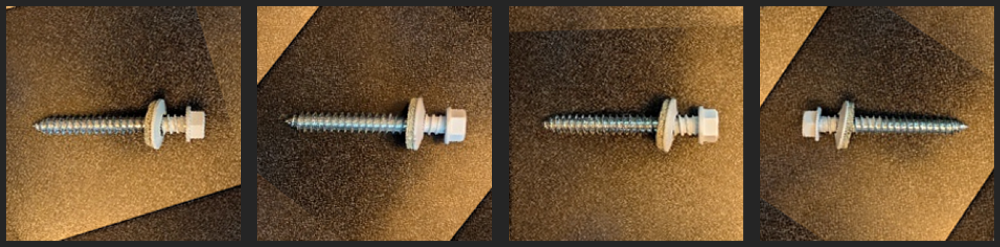

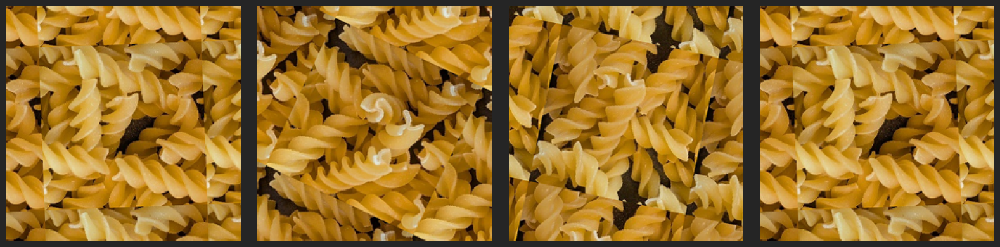

In [ ]:
def preprocess_image(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    mask = np.full(img.shape[:2], 255, dtype=np.uint8)

    mean, angle, scale, _ = pca_info(img)

    pad = max(img.shape)
    img = cv2.copyMakeBorder(img, pad, pad, pad, pad, borderType=cv2.BORDER_WRAP)
    mask = cv2.copyMakeBorder(mask, pad, pad, pad, pad, borderType=0)

    # TRANSFORM IMAGE AND MASK
    center = (img.shape[1] // 2, img.shape[0] // 2)
    mean = (pad // 2 - mean[0], pad // 2 - mean[1])

    T_translate = np.float32([
        [1, 0, mean[1]],
        [0, 1, mean[0]]
    ])
    img = cv2.warpAffine(img, T_translate, img.shape[:2], flags=cv2.INTER_CUBIC)
    mask = cv2.warpAffine(mask, T_translate, mask.shape[:2], flags=cv2.INTER_CUBIC)

    T_rotate = cv2.getRotationMatrix2D(center, angle, 1)
    img = cv2.warpAffine(img, T_rotate, img.shape[:2], flags=cv2.INTER_CUBIC)
    mask = cv2.warpAffine(mask, T_rotate, mask.shape[:2], flags=cv2.INTER_CUBIC)

    cropped = img[center[0] - scale:center[0] + scale, center[1] - scale:center[1] + scale]
    img = cv2.resize(cropped, (224, 224), interpolation=cv2.INTER_CUBIC)

    cropped_mask = mask[center[0] - scale:center[0] + scale, center[1] - scale:center[1] + scale]
    mask = cv2.resize(cropped_mask, (224, 224), interpolation=cv2.INTER_NEAREST)

    return img, mask

# PLOTTING
for key in train_datasets.keys():
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    fig.patch.set_facecolor("#252525")
    for i in range(4):
        image_path = random.choice(os.listdir(train_datasets[key]))
        image_path = os.path.join(train_datasets[key], image_path)

        img, _ = preprocess_image(image_path)

        axes[i].imshow(img)
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()


# Feature Extraction
* Load DINOv2 Model
* Additional pre-processing
  * Convert to tensor
  * Scale image by 3.5 to make each feature patch from 4x4 pixels
  * Apply gaussian blur
  * Normalize colors

* Use model to extract features
* Analyze feature vectors along horizontal axis, compare against a reference orientation feature vector to correct object polarity.
* Return extracted features, reference orientation vector, and flipped flag.



In [ ]:
%%capture
dino_model = torch.hub.load('facebookresearch/dinov2', 'dinov2_vitb14').to(device)
dino_model.eval()

In [ ]:
def get_features(img, ref_orientation=None):
    torch.cuda.empty_cache()

    dino_scale = 3.5

    # DINO PREPROCESS
    image = Image.fromarray(img)

    tensor_transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize((int(224 * dino_scale), int(224 * dino_scale))),
        transforms.GaussianBlur(5, sigma=2),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])

    img_tensors = tensor_transform(image).unsqueeze(0).to(device)

    # EXTRACT FEATURES
    with torch.no_grad():
        out = dino_model.forward_features(img_tensors)

    features = out['x_prenorm'][:, 1:, :].cpu().numpy()
    features = features.reshape(int(16 * dino_scale), int(16 * dino_scale), 768)

    # CORRECT ORIENTATION
    half = features.shape[0] // 2
    orientation = np.mean(features[half, :half, :] - features[half, half:, :], axis=0)

    if ref_orientation is None:
        ref_orientation = orientation

    flipped = False
    if np.dot(orientation, ref_orientation) < 0:
        features = features[:, ::-1, :]
        flipped = True

    return features, ref_orientation, flipped

# Build Feature Memory Bank
* Iterate through all images in our expanded training set.
* Pre-process and extract features from the images.
* Stack extracted features to build memory bank


⚠ WARNING: This step will take about 40 minutes on CPU or 30 seconds on the T4 runtime

In [ ]:
def build_feature_bank(key):
    ref_orientation = None
    feature_bank = []
    for image in tqdm(np.sort(os.listdir(train_datasets[key])), f"Processing {key}"):
        image_path = os.path.join(train_datasets[key], image)
        img, _ = preprocess_image(image_path)
        features, ref_orientation, _ = get_features(img, ref_orientation)
        feature_bank.append(features)

    feature_bank = np.stack(feature_bank)
    return feature_bank, ref_orientation


if not torch.cuda.is_available():
  print("This will be really slow since you are on CPU runtime.")
  print("Switch to T4 hosted runtime for better performance,\n")

feature_banks = {}
ref_orientations = {}

for key in train_datasets.keys():
    feature_banks[key], ref_orientations[key] = build_feature_bank(key)

print("\nDone")

Processing pasta: 100%|██████████| 34/34 [00:18<00:00,  1.82it/s]



Done


# Construct Anomaly Maps
* Run evaluation image through our pre-process and feature extraction stages
* Iterate through all indecies of our extracted feature matrix
  * Find closest feature embedding at that index within feature memory bank
  * Calculate euclidean distance between test embedding and closest embedding
  * Construct anomaly map from these calculated distances

* Repeat for all evaluation images

⚠ WARNING: This step will take about 20 minutes on CPU or 15 seconds on the T4 runtime

In [ ]:
from scipy.spatial.distance import cdist


def evaluate_image(image_path, key, threshold=0.2, min_area=5):
    img, mask = preprocess_image(image_path)
    features, orientation, flipped = get_features(img, ref_orientations[key])

    img = cv2.bitwise_and(img, img, mask=mask)
    mask = cv2.resize(mask, (features.shape[1], features.shape[0]))

    if flipped:
        img = cv2.flip(img, 1)
        mask = cv2.flip(mask, 1)

    # MEASURE NEAREST NEIGHBOUR DISTANCE AT EACH PATCH
    anomaly_map = np.full(features.shape[:2], np.nan, dtype=np.float32)
    for r in range(features.shape[0]):
        for c in range(features.shape[1]):
            if mask[r, c] == 255:
                index_features = features[r, c, :].reshape(1, -1)
                feature_memory = feature_banks[key][:, r, c, :]
                distances = cdist(index_features, feature_memory, metric="euclidean")
                anomaly_map[r, c] = np.min(distances)

    return img, anomaly_map


anomaly_maps = {"good": [], "bad": []}
for key, dataset in test_datasets.items():
    for label, folder in dataset.items():
        for image in tqdm(np.sort(os.listdir(folder)), desc=f"Processing {label} {key}"):
            image_path = os.path.join(folder, image)
            _, anomaly_map = evaluate_image(image_path, key)
            anomaly_maps[label].append(anomaly_map)

print("\n\nDone")

Processing bad pasta: 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]



Done


# Post-process Raw Anomaly Maps with Optimized Hyperparameters
* Raw anomaly maps have too much information to effectively classify
* Min-threshold, Max-threshold, and morpholigically filter the raw anomlay map according to a passed config file.
* Post-processing hyperparameters are determined by an optimization loop that checks resulting AUROC score.
* Optimizer also picks scoring method from Max, Mean and 99 percentile.
* Optimizer loops for specified timeout length, randomizing hyper parameters, looking for best margin

In [ ]:
from skimage.morphology import remove_small_objects, remove_small_holes


def post_process(raw_anomaly_map, config):
    processed_map = raw_anomaly_map.copy()

    # THRESHOLDING
    binary_mask = (processed_map > config["min_threshold"]) & (processed_map < config["max_threshold"])

    # MORPHOLOGICAL FILTERING
    cleaned_mask = remove_small_objects(binary_mask, min_size=config["min_object"])
    cleaned_mask = remove_small_holes(cleaned_mask, area_threshold=config["min_hole"])

    processed_map_final = processed_map.copy()
    processed_map_final[~cleaned_mask] = np.nan
    processed_map_final = processed_map_final.astype(np.float32)

    return processed_map_final


In [ ]:
import time
from collections import defaultdict
from sklearn.metrics import roc_curve, auc

def random_config():
    config = {}
    config["min_threshold"] = random.uniform(35, 45)
    config["max_threshold"] = random.uniform(config["min_threshold"], 55)

    config["min_object"] = random.randint(1, 5)
    config["min_hole"] = random.randint(5, 20)
    return config


best_margin = -99
best_margin_config = {}

best_auroc = 0
best_auroc_config = {}

timeout = 60
start_time = time.time()

print(f"Running optimizer for {timeout} seconds...\n")

format = "Running Optimizer: {percentage:3.0f}%|{bar}| [{elapsed}<{remaining}]{postfix}"
with tqdm(total=timeout, bar_format=format) as pbar:
    while True:
        elapsed = time.time() - start_time
        if elapsed >= timeout:
            break

        config = random_config()
        scores = defaultdict(lambda: defaultdict(list))

        # SCORE EACH POST PROCESSED MAP
        for key in ["good", "bad"]:
            for anomaly_map in anomaly_maps[key]:
                processed = post_process(anomaly_map, config)
                if np.all(np.isnan(processed)):
                    scores["max"][key].append(0)
                    scores["mean"][key].append(0)
                    scores["99p"][key].append(0)
                    continue

                scores["max"][key].append(np.nanmax(processed))
                scores["mean"][key].append(np.nanmean(processed))
                scores["99p"][key].append(np.nanpercentile(processed, 99))

        # DETERMINIE HYPERPARAM PERFORMANCE
        for method in scores.keys():
            config["method"] = method

            y_true = [0] * len(scores[method]["good"]) + [1] * len(scores[method]["bad"])
            y_scores = np.array(scores[method]["good"] + scores[method]["bad"])
            fpr, tpr, thresholds = roc_curve(y_true, y_scores)
            auroc = auc(fpr, tpr)

            if auroc > best_auroc:
                best_auroc_config = config.copy()
                best_auroc = auroc

            worst_good = np.nanmax(scores[method]["good"])
            best_bad = np.nanmin(scores[method]["bad"])
            margin = best_bad - worst_good

            if margin > best_margin:
                best_config = config.copy()
                best_margin = margin

        pbar.set_postfix_str(f"   Best AUROC: {best_auroc:.3f}      Best Margin: {best_margin:.3f}")
        pbar.n = min(elapsed, timeout)
        pbar.refresh()

if auroc == 1:
    best_config = best_margin_config
else:
    best_config = best_auroc_config

print(f"\n\n# best_config = {best_config}")



Running optimizer for 60 seconds...



Running Optimizer: 100%|█████████▉| [01:00<00:00],    Best AUROC: 1.000      Best Margin: 0.160



# best_config = {'min_threshold': 39.555944731231605, 'max_threshold': 49.94202968199089, 'min_object': 1, 'min_hole': 16, 'method': '99p'}


# Evaluate Performance
* Determine anomaly score from post-processed anomaly maps, using determined scoring method
* Plot histogram and AUROC Curve

Post-process config: {'min_threshold': 39.555944731231605, 'max_threshold': 49.94202968199089, 'min_object': 1, 'min_hole': 16, 'method': '99p'}



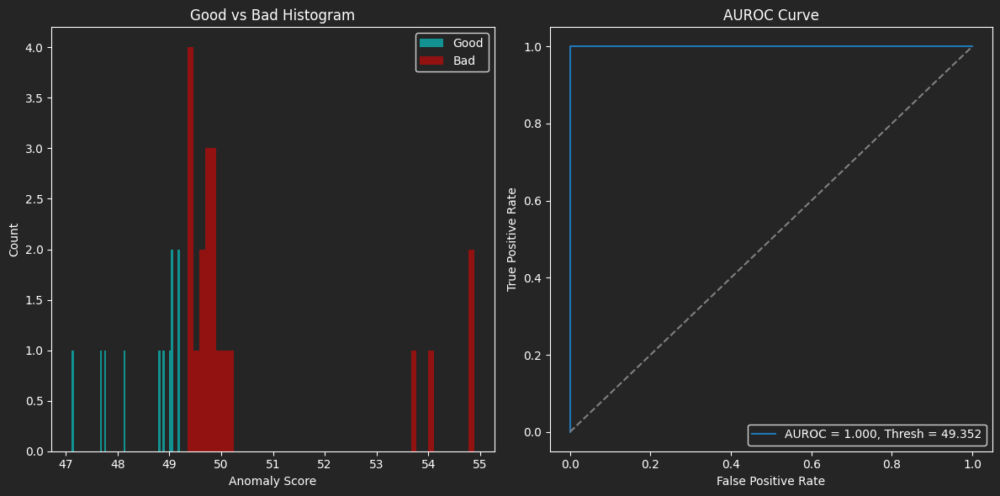

Optimal threshold: 49.352
F1 score: 1.000
Accuracy: 1.000
Precision: 1.000
Recall: 1.000


In [ ]:
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score

best_config = {'min_threshold': 39.555944731231605, 'max_threshold': 49.94202968199089, 'min_object': 1, 'min_hole': 16, 'method': '99p'}

config = best_config
print(f"Post-process config: {config}\n")

# SCORE IMAGES USING OPTIMIZED HYPERPARAMS
scores = defaultdict(lambda: defaultdict(list))
for key in ["good", "bad"]:
    for anomaly_map in anomaly_maps[key]:
        processed = post_process(anomaly_map, config)
        if np.all(np.isnan(processed)):
            scores["max"][key].append(0)
            scores["mean"][key].append(0)
            scores["99p"][key].append(0)
            continue

        scores["max"][key].append(np.nanmax(processed))
        scores["mean"][key].append(np.nanmean(processed))
        scores["99p"][key].append(np.nanpercentile(processed, 99))

# PLOT PERFORMANCE OF BEST SCORING METHOD
method = config["method"]
y_true = [0] * len(scores[method]["good"]) + [1] * len(scores[method]["bad"])
y_scores = np.concatenate((scores[method]["good"], scores[method]["bad"]))
fpr, tpr, thresholds = roc_curve(y_true, y_scores)

auroc = auc(fpr, tpr)
optimal_idx = np.argmax(tpr - fpr)
optimal_threshold = thresholds[optimal_idx]

fig, axs = plt.subplots(1, 2, figsize=(12, 6))
fig.patch.set_facecolor("#252525")

ax_hist = axs[0]
ax_hist.set_facecolor("#252525")
ax_hist.hist(scores[method]["good"], bins=50, color="cyan", alpha=0.5, label="Good")
ax_hist.hist(scores[method]["bad"], bins=50, color="red", alpha=0.5, label="Bad")
ax_hist.set_xlabel("Anomaly Score", color="white")
ax_hist.set_ylabel("Count", color="white")
ax_hist.set_title("Good vs Bad Histogram", color="white")
leg_hist = ax_hist.legend(facecolor="#252525", edgecolor="white")
for text in leg_hist.get_texts():
    text.set_color("white")
ax_hist.tick_params(colors="white")

ax_roc = axs[1]
ax_roc.set_facecolor("#252525")
ax_roc.plot(fpr, tpr, label=f"AUROC = {auroc:.3f}, Thresh = {optimal_threshold:.3f}")
ax_roc.plot([0, 1], [0, 1], linestyle="--", color="gray")
ax_roc.set_xlabel("False Positive Rate", color="white")
ax_roc.set_ylabel("True Positive Rate", color="white")
ax_roc.set_title("AUROC Curve", color="white")
leg_roc = ax_roc.legend(facecolor="#252525", edgecolor="white")
for text in leg_roc.get_texts():
    text.set_color("white")
ax_roc.tick_params(colors="white")

for ax in [ax_hist, ax_roc]:
    for spine in ax.spines.values():
        spine.set_edgecolor("white")

plt.tight_layout()
plt.show()

y_pred = (y_scores >= optimal_threshold).astype(int)
f1 = f1_score(y_true, y_pred)
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)

print(f"Optimal threshold: {optimal_threshold:.3f}")
print(f"F1 score: {f1:.3f}")
print(f"Accuracy: {accuracy:.3f}")
print(f"Precision: {precision:.3f}")
print(f"Recall: {recall:.3f}")


# Visualize Resulting Anomaly Maps (Optional)
⚠ WARNING: This step will take about 20 minutes on CPU or 30 seconds on the T4 runtime

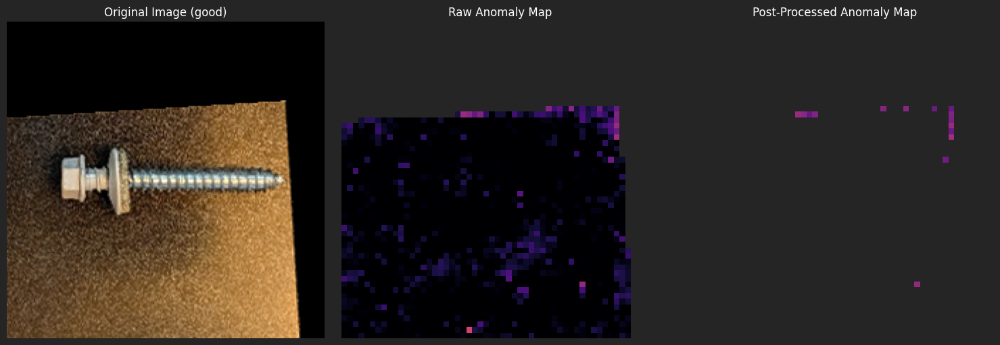

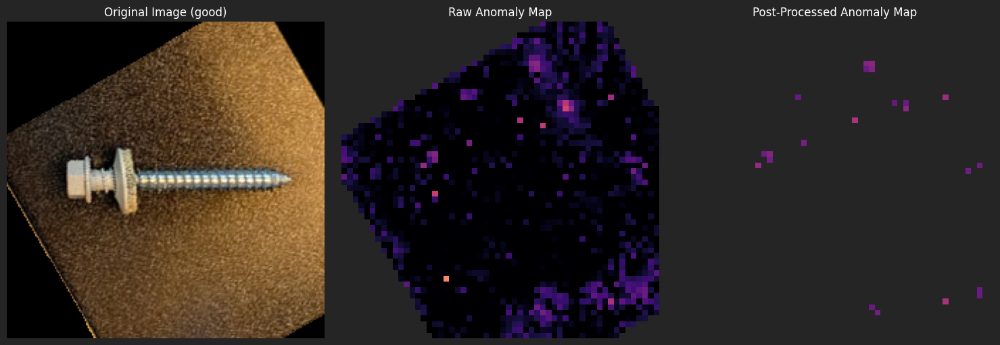

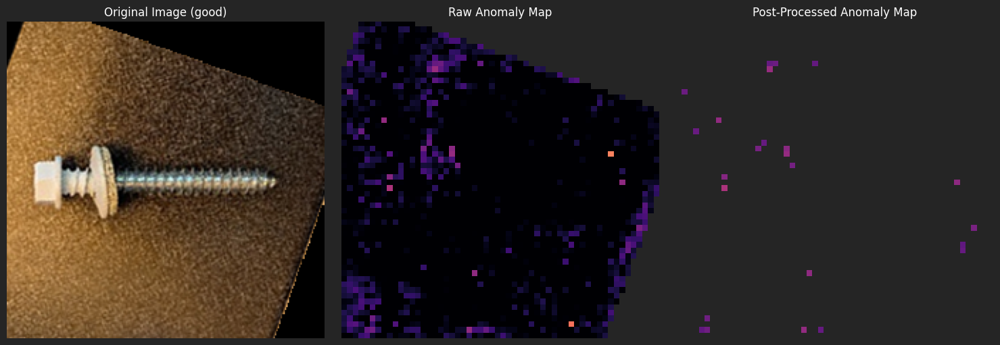

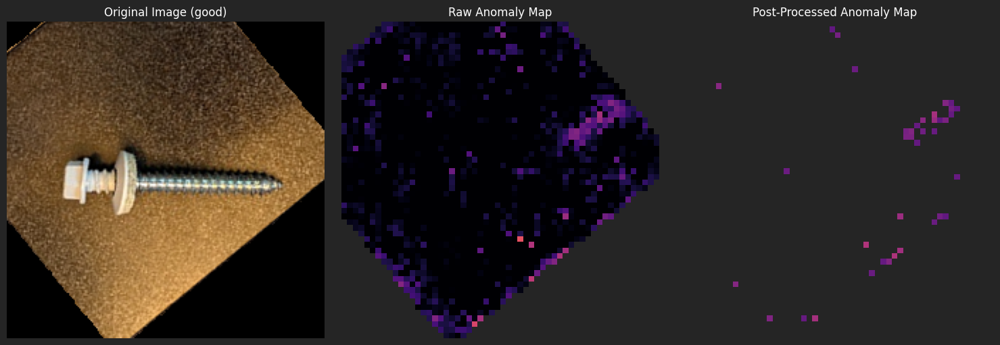

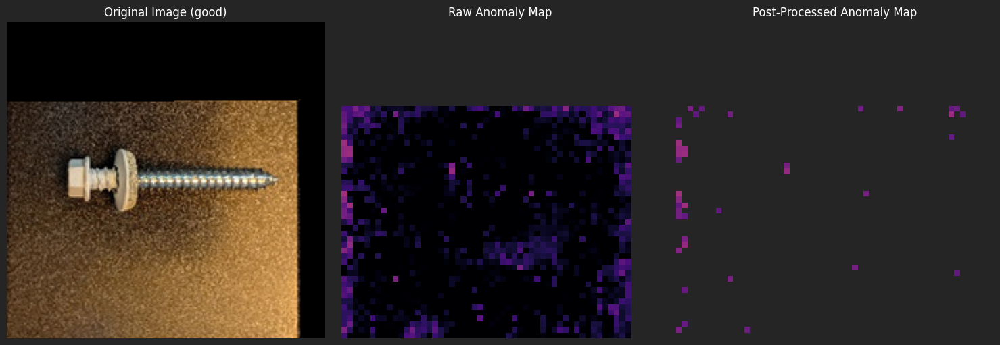

...

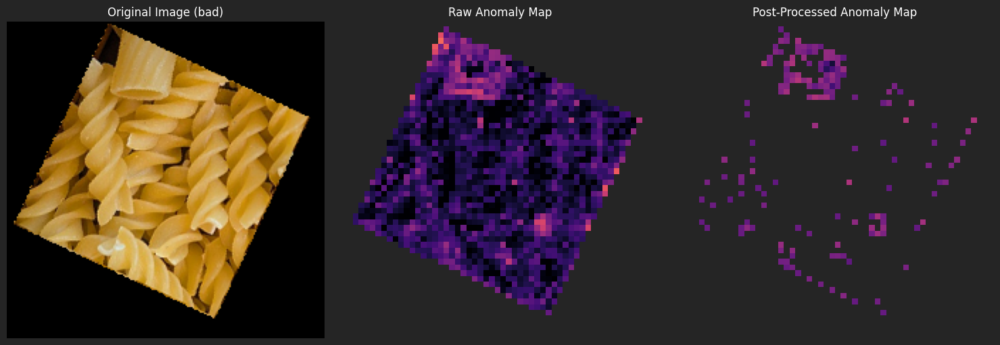

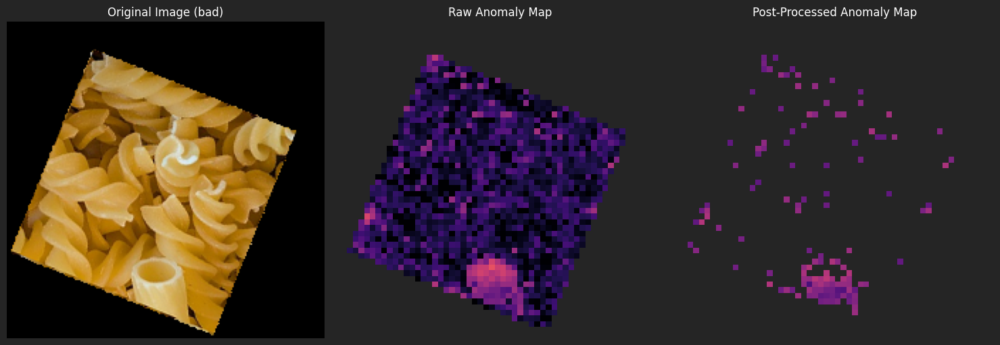

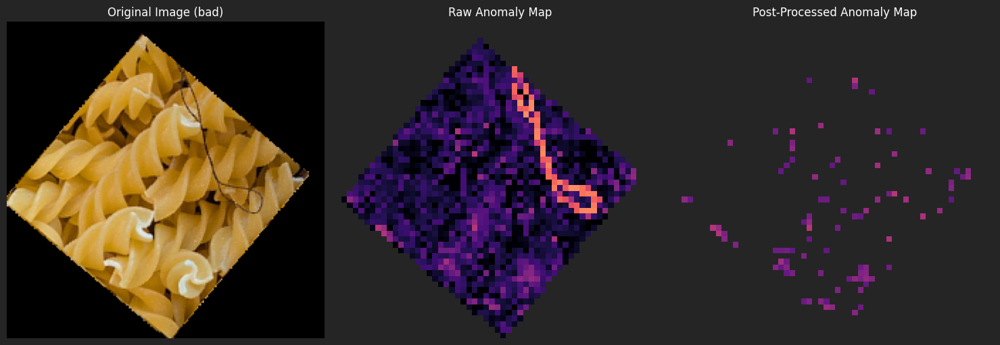

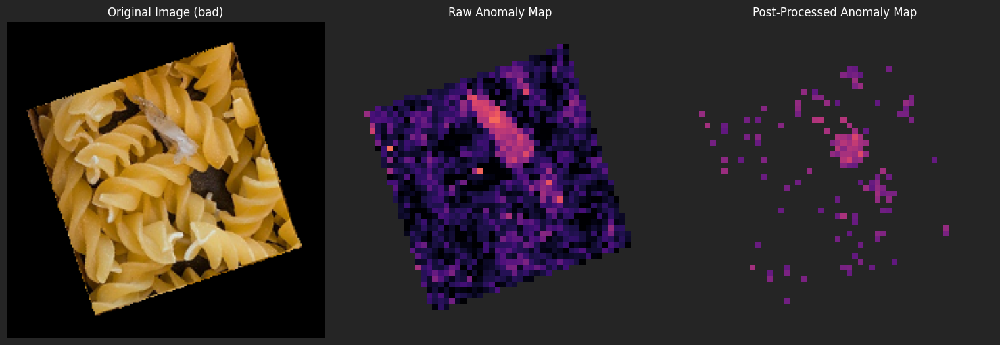

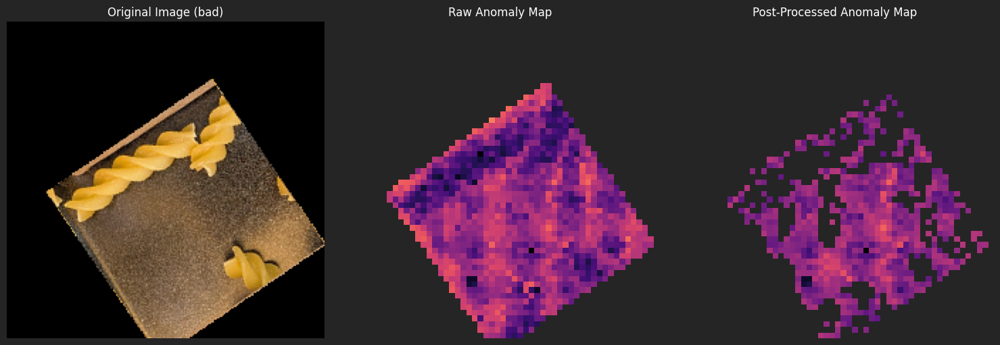

In [ ]:
VISUALIZE_ANOMALY_MAPS = True

if VISUALIZE_ANOMALY_MAPS:
  for key, dataset in test_datasets.items():
      for label, folder in dataset.items():
          for image in np.sort(os.listdir(folder)):
              image_path = os.path.join(folder, image)
              img, raw_anomaly_map = evaluate_image(image_path, key)
              processed_anomaly_map = post_process(raw_anomaly_map, best_config)

              # PLOTTING
              fig, axes = plt.subplots(1, 3, figsize=(15, 5))
              fig.patch.set_facecolor("#252525")
              axes[0].imshow(img)
              axes[0].set_title(f"Original Image ({label})", color="white")
              axes[0].axis("off")

              axes[1].imshow(raw_anomaly_map, cmap="magma", vmin=25, vmax=75)
              axes[1].set_title("Raw Anomaly Map", color="white")
              axes[1].axis("off")

              axes[2].imshow(processed_anomaly_map, cmap="magma", vmin=25, vmax=75)
              axes[2].set_title("Post-Processed Anomaly Map", color="white")
              axes[2].axis("off")

              plt.tight_layout()
              plt.show()